In [13]:
import pandas as pd
import numpy as np
import scipy.sparse as ss

import pickle
from collections import Counter
from pprint import pprint

import re
import string

import nltk
#nltk.download()
from nltk.stem.snowball import SnowballStemmer
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords

import spacy
from spacy import displacy
from spacy.symbols import amod
from spacy.lang.en.stop_words import STOP_WORDS

from sklearn.feature_extraction.text import CountVectorizer 
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import NMF
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import pairwise_distances

import scattertext as st

from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

import pyLDAvis
import pyLDAvis.sklearn


from corextopic import corextopic as ct
from corextopic import vis_topic as vt

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import swat
from sklearn.manifold import TSNE

# Get Data

In [14]:
with open('ted_video_transcripts_2416.pkl', 'rb') as picklefile:
    talks = pickle.load(picklefile)

In [103]:
with open('ted_video_stats_2722.pkl', 'rb') as picklefile:
    stats = pickle.load(picklefile)

In [105]:
!pwd

/Users/elena/Desktop/Metis/Project_4_Ted/Project-4-Ted


In [106]:
with open('ted_video_comments_emotions.pkl', 'rb') as picklefile:
    comment = pickle.load(picklefile)

In [16]:
talks.head(2)

,video_id,transcript
0,YgAuFqEs6yk,[{'text': 'I remember watching my father raise...
1,bNmRr-BYnxA,[{'text': 'Transcriber: Joseph Geni Reviewer: ...


In [17]:
len(talks)

2416

In [18]:
stats.head(2)

,video_id,tags,title,publushed_date,comments_count,dislike_count,like_count,views_count,today,days_age,views_per_day,dislike_perc_of_likes,success,prime_tag
0,Bb7kz1THJPU,"[Science Fiction, Future, Creativity, Society,...","Go ahead, dream about the future | Charlie Jan...",2020-04-20 13:28:47,653,846,2082,71384,2020-05-16,25,2855.360000,40.634006,no,Science Fiction
0,cTIUiN6inIQ,"[The Way We Work, work]",How to make faster decisions | The Way We Work...,2020-02-10 15:00:24,98,84,4298,145314,2020-05-16,95,1529.621053,1.954397,yes,The Way We Work


In [19]:
len(stats)

2722

# Text Preprocessing

### Formatting

In [20]:
def clean_transcript(dirty_line):
    output = ''
    for el in dirty_line: #df['transcript'].values[0]
        for key, value in el.items():
            line_output = str.join("", value)
            output += " " 
            output += line_output
    return output

In [21]:
talks['transcript'] = talks['transcript'].map(clean_transcript)

### SpaCy

In [22]:
nlp = spacy.load('en')

In [23]:
len(STOP_WORDS)

326

In [24]:
my_stop_words_list = ['Transcriber', 'Translator', 'reviewer', 'thanks', 'thank', '\n',
                     'applause','music', 'Laughter', 'applaud', 'TED', 'applause', 'TED Talks',
                     'TED workshop', 'Elizabeth',  'Gilbert', 'Ivana', 'Korom','Krystian', 'Aparta', 'Walters',
                     'Joseph','Geni', 'thing', 'think', 'know', 'like', 'way', 'look', 'lot', 'good', 'bad', 'want', 'kind', 
                     'talk', 'word', 'actually', 'hi', 'woman', 'man', 
                      'people', 'say', 'come', 'feel', 'tell','ve', 'day', 'right','think',
                     '']
for word in my_stop_words_list:
    spacy.lang.en.stop_words.STOP_WORDS.add(word)
    nlp.vocab[word].is_stop = True

In [25]:
#STOP_WORDS

In [26]:
persons = []
for i in range(talks.shape[0]):
    persons.append([ent.text for ent in nlp(talks['transcript'][i]).ents if ent.label_ == 'PERSON'])

In [27]:
#persons

In [28]:
persons_flat_list = [item for sublist in persons for item in sublist]

In [29]:
#persons_flat_list

In [30]:
persons_flat_list = str(persons_flat_list).replace("'", '').replace(",", '').replace(":", '').replace("[", '').split()

In [31]:
errors = ['Parenthood', 'Mamas', 'corona','misstep', 'monk', 'moon', 'Paris', 'attach kid', 'Berlin 2005', 
          'butterfly', 'Xbox', 'Uber Lyft', 'Crisis Text Line', 'God', 'Law', 'Moon', 'Sun', 'microphone hiss',
          'sanitary napkin', 'hygiene piece', 'hygiene piece', 'downright macabre','berlin',
          'applaud african', 'diaspora hear', 'politician mirror', 'bradfeld', 'carrier asymptomatic',
          'New Yorker', 'yank mouth', 'metaphor monk', 'Facebook', 'LEGOs lego', 'lot hubris','healthy leafy green',
          'hygiene factor', 'healthy melatonin', 'lover gentle', 'mosquito','Gmail','iCloud Apple',
          'Kaspersky', 'bomb satsang wood', 'kiosk', 'intro', 'sama buona ICU', 'need belong','thousand',
          'snooze button', 'primarily white', 'gnash throat', 'fangirl learn', 'Xbox PlayStation', 'butterfly']

In [32]:
persons_flat_list = persons_flat_list
for i in persons_flat_list:
    if i in errors:
       # print(i)
        persons_flat_list.remove(i)

In [33]:
#persons_flat_list

In [34]:
for word in persons_flat_list:
    spacy.lang.en.stop_words.STOP_WORDS.add(word)
    nlp.vocab[word].is_stop = True

In [35]:
nlp.vocab['woman'].is_stop

True

In [36]:
##########talks = talks.iloc[:50, :]

In [37]:
talks.head(6)

,video_id,transcript
0,YgAuFqEs6yk,I remember watching my father raised the pist...
1,bNmRr-BYnxA,Transcriber: Joseph Geni\nReviewer: Camille M...
2,FVUkKKc3Vvk,"Hi, everyone, my name is Elizabeth, and I wor..."
3,8bj0GR34XWc,Transcriber: Ivana Korom\nReviewer: Krystian ...
4,eaCrsBtiYA4,I am a public policy wonk. I investigate data...
5,OMDVTZ-ycaY,Transcriber: Joseph Geni\nReviewer: Joanna Pi...


In [38]:
talks['transcript1'] = talks.transcript.apply(
    lambda text: ' '.join(token.orth_ for token in nlp(text) if not token.is_punct))

In [39]:
talks['transcript2'] = talks.transcript1.apply(
    lambda text: ' '.join(token.lemma_ for token in nlp(text) if not token.is_stop))

In [40]:
talks['transcript2'] = talks['transcript2'].apply(lambda text: re.sub('\n', '', text))

In [41]:
talks['transcript'] = talks['transcript2']

In [42]:
talks.drop(['transcript1', 'transcript2'], inplace=True, axis=1)

In [43]:
talks['transcript'] = talks['transcript'].apply(lambda text: re.sub(r'\b[0-9]+\b\W*', '', text))

### Plarity scores addition 

In [44]:
analyser = SentimentIntensityAnalyzer()
def extract_polarity(text, polarity_type = 'neg'):
    all_val = analyser.polarity_scores(text)
    return all_val[polarity_type]
    

In [45]:
talks['polarity_neg_transcript'] = talks['transcript'].map(extract_polarity)
talks['polarity_pos_transcript'] = talks['transcript'].apply(extract_polarity, polarity_type = 'pos')
talks['polarity_neu_transcript'] = talks['transcript'].apply(extract_polarity, polarity_type = 'neu')
talks['polarity_compound_transcript'] = talks['transcript'].apply(extract_polarity, polarity_type = 'compound')

In [107]:
df1 = pd.merge(talks, stats,  how='left', left_on='video_id', right_on = 'video_id')

In [112]:
df1.head()

,video_id,transcript,polarity_neg_transcript,polarity_pos_transcript,polarity_neu_transcript,polarity_compound_transcript,tags,title,publushed_date,comments_count,...,trust,fear,negative,sadness,anger,surprise,positive,disgust,joy,anticipation
0,YgAuFqEs6yk,remember watch father raise pistol plead gu...,0.133,0.330,0.537,0.9996,"[Family, Parenting, Communication, Children, R...","How to co-parent as allies, not adversaries | ...",2020-05-14 14:40:00,109,...,0.007296,0.003192,0.003648,0.002736,0.001824,0.004560,0.019608,0.001368,0.010032,0.008664
1,bNmRr-BYnxA,think give half humanity ' spend week...,0.194,0.267,0.539,0.9980,"[climate change, environment, global issues, c...",How to shift your mindset and choose your futu...,2020-05-13 14:22:51,205,...,0.008208,0.004560,0.006840,0.002280,0.003648,0.002280,0.021888,0.002280,0.004560,0.008664
2,FVUkKKc3Vvk,work trading floor ' m pretty new graduate ...,0.111,0.306,0.583,0.9993,"[Life, Society, Immigration, Humanity, Self, P...",What's missing from the American immigrant nar...,2020-05-12 18:06:31,234,...,0.003648,0.001368,0.001824,0.001824,0.000912,0.001824,0.005928,0.000000,0.002280,0.005016
3,8bj0GR34XWc,worry pandemic pretty life play absolut...,0.135,0.166,0.699,0.9492,"[global issues, science, collaboration, virus,...",A global pandemic calls for global solutions |...,2020-05-11 15:52:37,236,...,0.004104,0.002736,0.004560,0.002736,0.002736,0.001824,0.006840,0.002280,0.002736,0.002280
4,eaCrsBtiYA4,public policy wonk investigate datum point ...,0.200,0.164,0.636,-0.9904,[],Racism has a cost for everyone | Heather C. Mc...,2020-05-08 18:44:35,542,...,0.004104,0.000912,0.001824,0.001368,0.000912,0.002280,0.008208,0.000456,0.003192,0.003192


In [109]:
df1 = pd.merge(df1, comment,  how='left', left_on='video_id', right_on = 'video_id')

In [110]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2418 entries, 0 to 2417
Data columns (total 34 columns):
video_id                        2418 non-null object
transcript                      2418 non-null object
polarity_neg_transcript         2418 non-null float64
polarity_pos_transcript         2418 non-null float64
polarity_neu_transcript         2418 non-null float64
polarity_compound_transcript    2418 non-null float64
tags                            2408 non-null object
title                           2408 non-null object
publushed_date                  2408 non-null datetime64[ns]
comments_count                  2394 non-null object
dislike_count                   2408 non-null object
like_count                      2408 non-null object
views_count                     2408 non-null object
today                           2408 non-null datetime64[ns]
days_age                        2408 non-null float64
views_per_day                   2408 non-null float64
dislike_perc_of_likes  

In [111]:
with open('JOINT_ted_video_transcripts_comments_stats.pkl', 'wb') as picklefile:
    pickle.dump(df1, picklefile)

# EDA 

### Scattertext

In [44]:
 corpus = st.CorpusFromPandas(df1,
                              category_col='success',
                              text_col='transcript',
                              nlp=st.whitespace_nlp_with_sentences
                             ).build()

In [45]:
 html = st.produce_scattertext_explorer(
         corpus,
         category='yes',
         category_name='Likable',
         not_category_name='Dislikable',
         minimum_term_frequency=10,
         pmi_threshold_coefficient=5,
         width_in_pixels=1000,
         #metadata=df1['prime_tag']
         metadata=corpus.get_df()['prime_tag']
         )

In [77]:
open('transcripts_0518.html', 'wb').write(html.encode('utf-8'));

### LDA PyViz

In [47]:
vectorizer = CountVectorizer(analyzer='word',       
                             min_df=10,                        # minimum reqd occurences of a word 
                             stop_words='english',             # remove stop words
                             lowercase=True,                   # convert all words to lowercase
                             token_pattern='[a-zA-Z0-9]{3,}',  # num chars > 3
                             max_features=1000,                # max number of uniq words
                            )

data_vectorized = vectorizer.fit_transform(talks.transcript)

In [48]:
n_components = 7

lda_model = LatentDirichletAllocation(n_components=n_components,   # Number of topics
                                      max_iter=10,                 # Max learning iterations
                                      learning_method='online',   
                                      random_state=100,            # Random state
                                      #batch_size=128,             # n docs in each learning iter
                                      n_jobs = -1,                 # Use all available CPUs
                                     )
lda_output = lda_model.fit_transform(data_vectorized)

print(lda_model)  # Model attributes

LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
                          evaluate_every=-1, learning_decay=0.7,
                          learning_method='online', learning_offset=10.0,
                          max_doc_update_iter=100, max_iter=10,
                          mean_change_tol=0.001, n_components=7, n_jobs=-1,
                          perp_tol=0.1, random_state=100, topic_word_prior=None,
                          total_samples=1000000.0, verbose=0)


In [49]:
pyLDAvis.enable_notebook()

panel = pyLDAvis.sklearn.prepare(lda_model, data_vectorized, vectorizer)
panel

/Users/elena/opt/anaconda3/lib/python3.7/site-packages/pyLDAvis/_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3      0.058469  0.012170       1        1  23.780393
1      0.107484 -0.070652       2        1  17.280458
2     -0.092366  0.005491       3        1  14.906867
4      0.034753 -0.053973       4        1  14.313169
0     -0.083885 -0.075605       5        1  12.182128
5      0.059797  0.127075       6        1   8.814261
6     -0.084252  0.055495       7        1   8.722724, topic_info=    Category         Freq     Term        Total  loglift  logprob
90   Default  2645.000000    brain  2645.000000  30.0000  30.0000
117  Default  1966.000000     cell  1966.000000  29.0000  29.0000
982  Default  3246.000000    woman  3246.000000  28.0000  28.0000
966  Default  2387.000000    water  2387.000000  27.0000  27.0000
187  Default  3715.000000  country  3715.000000  26.0000  26.0000
..       ...          ...      ...          ...      ...      ...
520   Topic7   464.416300     look  4212.324951   0.2342  -5.2092
585   Topic7   506.008304     need  7929.744541  -0.3126  -5.1234
500   Topic7   467.107822      let  4784.631760   0.1126  -5.2034
847   Topic7   457.365266    start  6768.382623  -0.2553  -5.2245
689   Topic7   442.155238  problem  3946.007760   0.2504  -5.2583

[421 rows x 6 columns], token_table=      Topic      Freq   Term
term                        
1         1  0.132840   able
1         2  0.140105   able
1         3  0.265335   able
1         4  0.069534   able
1         5  0.113468   able
...     ...       ...    ...
997       3  0.005665  young
997       4  0.005665  young
997       5  0.011897  young
997       6  0.093477  young
997       7  0.018129  young

[1848 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 2, 3, 5, 1, 6, 7])

# Topic Modeling

In [59]:
def display_topics(model, feature_names, no_top_words, model_type = 'lsa_nmf_lda', topic_names=None):
    if model_type == 'lsa_nmf_lda':
        for ix, topic in enumerate(model.components_):
            if not topic_names or not topic_names[ix]:
                print("\nTopic ", ix)
            else:
                print("\nTopic: '",topic_names[ix],"'")
            print(", ".join([feature_names[i]
                            for i in topic.argsort()[:-no_top_words - 1:-1]]))
    elif model_type == 'corex':
        for ix, topic in enumerate(model.alpha):
            if not topic_names or not topic_names[ix]:
                print("\nTopic ", ix)
            else:
                print("\nTopic: '",topic_names[ix],"'")
            print(", ".join([feature_names[i]
                            for i in topic.argsort()[:-no_top_words - 1:-1]]))
    else:
        raise ValueError('Unknown model type')

### Text transformation

TF_IDF

In [60]:
vectorizer_TF_IDF = TfidfVectorizer(stop_words='english', max_df=1.0, min_df=2, strip_accents='ascii') 
doc_word_TF_IDF = vectorizer_TF_IDF.fit_transform(list(talks.transcript))

In [61]:
pd.DataFrame(doc_word_TF_IDF.toarray(), columns=vectorizer_TF_IDF.get_feature_names()).shape

(2416, 21028)

In [62]:
dtm_TF_IDF = pd.DataFrame(doc_word_TF_IDF.toarray(), index=talks['video_id'], columns=vectorizer_TF_IDF.get_feature_names())
words_TF_IDF = list(np.asarray(vectorizer_TF_IDF.get_feature_names()))

Basic (for LDA)

In [63]:
vectorizer = CountVectorizer(stop_words='english', max_df=1.0, min_df=2, strip_accents='ascii') 
doc_word = vectorizer.fit_transform(list(talks.transcript))

In [64]:
pd.DataFrame(doc_word.toarray(), columns=vectorizer.get_feature_names()).shape

(2416, 21028)

In [65]:
dtm = pd.DataFrame(doc_word.toarray(), index=talks['video_id'], columns=vectorizer.get_feature_names())
words = list(np.asarray(vectorizer.get_feature_names()))

### NMF (Non-Negative Matrix Factorization)

In [145]:
nmf_model = NMF(10)
doc_topic = nmf_model.fit_transform(doc_word_TF_IDF)

In [146]:
topic_word = pd.DataFrame(nmf_model.components_.round(3),
             index = ["component_1","component_2", "component_3","component_4", "component_5",
                     "component_6","component_7", "component_8","component_9", "component_10"],
             columns = vectorizer_TF_IDF.get_feature_names())
topic_word

,000th,0s,1000th,100th,10th,10x,11th,12th,130th,13th,...,zoo,zoologist,zoology,zoom,zoonotic,zoop,zoos,zuccotti,zurich,zygote
component_1,0.000,0.002,0.000,0.000,0.002,0.000,0.002,0.006,0.002,0.001,...,0.000,0.001,0.002,0.036,0.000,0.000,0.000,0.000,0.002,0.000
component_2,0.000,0.000,0.000,0.004,0.004,0.000,0.008,0.005,0.001,0.007,...,0.002,0.000,0.001,0.000,0.000,0.002,0.000,0.000,0.001,0.000
component_3,0.003,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.011,0.000,0.000,0.000,0.005,0.000,0.000,0.000,0.000,0.000
component_4,0.000,0.000,0.000,0.003,0.000,0.001,0.002,0.002,0.000,0.001,...,0.000,0.000,0.000,0.000,0.002,0.000,0.000,0.003,0.000,0.000
component_5,0.000,0.000,0.001,0.000,0.000,0.001,0.000,0.000,0.000,0.000,...,0.012,0.000,0.002,0.017,0.001,0.000,0.001,0.000,0.000,0.000
component_6,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.002,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
component_7,0.000,0.000,0.000,0.001,0.013,0.000,0.003,0.003,0.000,0.000,...,0.000,0.000,0.000,0.006,0.000,0.000,0.000,0.001,0.005,0.003
component_8,0.000,0.001,0.000,0.000,0.001,0.000,0.000,0.002,0.000,0.002,...,0.000,0.002,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
component_9,0.001,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.003,0.000,0.000,0.024,0.000,0.000,0.001,0.000,0.001,0.000
component_10,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.010,0.000


In [147]:
display_topics(nmf_model, vectorizer_TF_IDF.get_feature_names(), 14)


Topic  0
computer, datum, machine, technology, information, work, thing, video, time, human, design, use, idea, build

Topic  1
say, life, love, time, story, feel, year, write, thing, think, friend, ask, start, work

Topic  2
patient, health, cancer, doctor, care, disease, hospital, medical, drug, treatment, medicine, blood, clinic, hiv

Topic  3
country, government, company, china, need, business, economic, percent, global, economy, money, year, change, democracy

Topic  4
planet, water, ocean, earth, fish, climate, mars, carbon, sea, plant, star, energy, coral, solar

Topic  5
woman, man, girl, sex, gender, female, male, sexual, boy, violence, young, feminist, right, community

Topic  6
city, building, design, build, space, community, architecture, neighborhood, street, urban, project, place, car, create

Topic  7
school, child, kid, student, teacher, education, girl, parent, family, learn, teach, college, classroom, community

Topic  8
brain, cell, gene, neuron, disease, body, prot

In [148]:
doc_topic_nmf = pd.DataFrame(doc_topic.round(5),
                             index=talks['video_id'],
                             columns = ["Progress with technology",
                                        "Phylosophy of life",
                                        "Healthcare and desease treatment",
                                        "International Politics",
                                        "Planet sustainability",
                                        "Gender",
                                        "Urbanistics", 
                                        "Younger generation education", 
                                        "Neuroscience",
                                        "Automation"])
doc_topic_nmf

,Progress with technology,Phylosophy of life,Healthcare and desease treatment,International Politics,Planet sustainability,Gender,Urbanistics,Younger generation education,Neuroscience,Automation
video_id,,,,,,,,,,
YgAuFqEs6yk,0.00000,0.11930,0.00000,0.00000,0.00145,0.00000,0.00002,0.05226,0.00000,0.00000
bNmRr-BYnxA,0.00000,0.07292,0.00898,0.06572,0.02743,0.00000,0.00811,0.00000,0.00122,0.00242
FVUkKKc3Vvk,0.00000,0.07471,0.00000,0.02536,0.00391,0.00000,0.00156,0.08094,0.00000,0.00317
8bj0GR34XWc,0.02082,0.01566,0.06309,0.03465,0.00587,0.00000,0.00000,0.00000,0.02086,0.00000
eaCrsBtiYA4,0.00000,0.02936,0.01159,0.09283,0.00000,0.01524,0.02599,0.02584,0.00000,0.00000
...,...,...,...,...,...,...,...,...,...,...
HUM2rCIUdeI,0.00217,0.01989,0.00056,0.07508,0.01511,0.00652,0.00369,0.02442,0.00000,0.00290
C_SBGTJgBGo,0.00276,0.05969,0.00510,0.00000,0.00000,0.00018,0.01531,0.00000,0.00500,0.00071
MLU7qcMYKO8,0.00000,0.00000,0.00000,0.00000,0.15556,0.00000,0.00000,0.00000,0.00000,0.00284


In [149]:
doc_topic_nmf['prime_topic'] = doc_topic_nmf.idxmax(axis=1)

In [150]:
doc_topic_nmf


,Progress with technology,Phylosophy of life,Healthcare and desease treatment,International Politics,Planet sustainability,Gender,Urbanistics,Younger generation education,Neuroscience,Automation,prime_topic
video_id,,,,,,,,,,,
YgAuFqEs6yk,0.00000,0.11930,0.00000,0.00000,0.00145,0.00000,0.00002,0.05226,0.00000,0.00000,Phylosophy of life
bNmRr-BYnxA,0.00000,0.07292,0.00898,0.06572,0.02743,0.00000,0.00811,0.00000,0.00122,0.00242,Phylosophy of life
FVUkKKc3Vvk,0.00000,0.07471,0.00000,0.02536,0.00391,0.00000,0.00156,0.08094,0.00000,0.00317,Younger generation education
8bj0GR34XWc,0.02082,0.01566,0.06309,0.03465,0.00587,0.00000,0.00000,0.00000,0.02086,0.00000,Healthcare and desease treatment
eaCrsBtiYA4,0.00000,0.02936,0.01159,0.09283,0.00000,0.01524,0.02599,0.02584,0.00000,0.00000,International Politics
...,...,...,...,...,...,...,...,...,...,...,...
HUM2rCIUdeI,0.00217,0.01989,0.00056,0.07508,0.01511,0.00652,0.00369,0.02442,0.00000,0.00290,International Politics
C_SBGTJgBGo,0.00276,0.05969,0.00510,0.00000,0.00000,0.00018,0.01531,0.00000,0.00500,0.00071,Phylosophy of life
MLU7qcMYKO8,0.00000,0.00000,0.00000,0.00000,0.15556,0.00000,0.00000,0.00000,0.00000,0.00284,Planet sustainability


In [151]:
cosine_similarity((doc_topic_nmf.iloc[:, :10].values[0], 
                   doc_topic_nmf.iloc[:, :10].values[1], 
                   doc_topic_nmf.iloc[:, :10].values[3],  
                   doc_topic_nmf.iloc[:, :10].values[4], 
                   doc_topic_nmf.iloc[:, :10].values[5], 
                   doc_topic_nmf.iloc[:, :10].values[6]))

array([[1.00000000e+00, 6.53455968e-01, 1.81110415e-01, 3.52270063e-01,
        1.92411423e-01, 6.09134729e-04],
       [6.53455968e-01, 1.00000000e+00, 5.10749011e-01, 7.87819409e-01,
        1.11784803e-01, 3.08057266e-02],
       [1.81110415e-01, 5.10749011e-01, 1.00000000e+00, 5.23746289e-01,
        3.94022678e-01, 3.05543769e-01],
       [3.52270063e-01, 7.87819409e-01, 5.23746289e-01, 1.00000000e+00,
        8.36348244e-02, 1.34237622e-02],
       [1.92411423e-01, 1.11784803e-01, 3.94022678e-01, 8.36348244e-02,
        1.00000000e+00, 4.79147969e-01],
       [6.09134729e-04, 3.08057266e-02, 3.05543769e-01, 1.34237622e-02,
        4.79147969e-01, 1.00000000e+00]])

In [152]:
pairwise_distances(doc_topic[0].reshape(1, -1),doc_topic,metric='cosine').argsort()

array([[   0,  293,  828, ..., 1685,  229, 1662]])

In [153]:
tsne = TSNE()

In [154]:
tsne_features = tsne.fit_transform(doc_topic_nmf.iloc[:, :10])

In [155]:
tsne_features.itemset

<function ndarray.itemset>

In [156]:
xs

array([ -1.225595,  30.86301 ,  29.525246, ..., -12.501224,  31.369274,
       -32.323154], dtype=float32)

In [157]:
doc_topic_nmf['prime_topic']

video_id
YgAuFqEs6yk                  Phylosophy of life
bNmRr-BYnxA                  Phylosophy of life
FVUkKKc3Vvk        Younger generation education
8bj0GR34XWc    Healthcare and desease treatment
eaCrsBtiYA4              International Politics
                             ...               
HUM2rCIUdeI              International Politics
C_SBGTJgBGo                  Phylosophy of life
MLU7qcMYKO8               Planet sustainability
yyemG7V5ynQ              International Politics
zDcaoTVy4fA               Planet sustainability
Name: prime_topic, Length: 2416, dtype: object

In [158]:
xs = tsne_features[:, 0]
ys = tsne_features[:, 1]

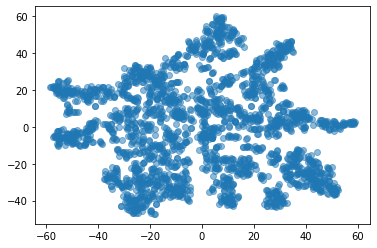

In [159]:
plt.scatter(xs, ys,
            alpha=0.5);


In [228]:
plt.figure(figsize=(16,10))
sns.scatterplot(
    x=xs, y=ys,
    hue='prime_topic',
    palette=sns.color_palette("muted", 10),
    data=doc_topic_nmf,
    legend="full",
    alpha=0.8
);

ValueError: array length 1978 does not match index length 2416

<Figure size 1152x720 with 0 Axes>

In [229]:
#doc_topic_nmf_rich.loc[:,['trust', 'fear', 'sadness', 'anger', 'surprise','disgust', 'joy', 'anticipation']]

In [230]:
#doc_topic_nmf_rich.iloc[0,35]

In [258]:
doc_topic_nmf_rich.columns

Index(['video_id', 'Progress with technology', 'Phylosophy of life',
       'Healthcare and desease treatment', 'International Politics',
       'Planet sustainability', 'Gender', 'Urbanistics',
       'Younger generation education', 'Neuroscience', 'Automation',
       'prime_topic', 'transcript', 'polarity_neg_transcript',
       'polarity_pos_transcript', 'polarity_neu_transcript',
       'polarity_compound_transcript', 'tags', 'title', 'publushed_date',
       'comments_count', 'dislike_count', 'like_count', 'views_count', 'today',
       'days_age', 'views_per_day', 'dislike_perc_of_likes', 'success',
       'prime_tag', 'comments', 'polarity_neg_comments',
       'polarity_pos_comments', 'polarity_neu_comments',
       'polarity_compound_comments', 'trust', 'fear', 'negative', 'sadness',
       'anger', 'surprise', 'positive', 'disgust', 'joy', 'anticipation',
       'prime_emotion', 'polarity_vader', 'polarity_plutchik'],
      dtype='object')

# Adding emotions

In [243]:
doc_topic_nmf_rich = pd.merge(doc_topic_nmf, df1,  how='left', left_on='video_id', right_on = 'video_id')

In [244]:
doc_topic_nmf_rich = doc_topic_nmf_rich.dropna()

In [245]:
doc_topic_nmf_rich['prime_emotion'] = doc_topic_nmf_rich.loc[:,['trust', 'fear', 'sadness', 'anger', 
                                                                'surprise', 'disgust', 'joy', 
                                                                'anticipation']].idxmax(axis=1)

In [246]:
doc_topic_nmf_rich['polarity_vader'] = doc_topic_nmf_rich.loc[:,['polarity_neg_comments', 
                                                                 'polarity_pos_comments']].idxmax(axis=1)

In [247]:
doc_topic_nmf_rich['polarity_plutchik'] = doc_topic_nmf_rich.loc[:,['negative', 
                                                                 'positive']].idxmax(axis=1)

In [248]:
doc_topic_nmf_rich[]

,video_id,Progress with technology,Phylosophy of life,Healthcare and desease treatment,International Politics,Planet sustainability,Gender,Urbanistics,Younger generation education,Neuroscience,...,sadness,anger,surprise,positive,disgust,joy,anticipation,prime_emotion,polarity_vader,polarity_plutchik
0,YgAuFqEs6yk,0.00000,0.11930,0.00000,0.00000,0.00145,0.00000,0.00002,0.05226,0.00000,...,0.002736,0.001824,0.004560,0.019608,0.001368,0.010032,0.008664,joy,polarity_pos_comments,positive
1,bNmRr-BYnxA,0.00000,0.07292,0.00898,0.06572,0.02743,0.00000,0.00811,0.00000,0.00122,...,0.002280,0.003648,0.002280,0.021888,0.002280,0.004560,0.008664,anticipation,polarity_pos_comments,positive
2,FVUkKKc3Vvk,0.00000,0.07471,0.00000,0.02536,0.00391,0.00000,0.00156,0.08094,0.00000,...,0.001824,0.000912,0.001824,0.005928,0.000000,0.002280,0.005016,anticipation,polarity_pos_comments,positive
3,8bj0GR34XWc,0.02082,0.01566,0.06309,0.03465,0.00587,0.00000,0.00000,0.00000,0.02086,...,0.002736,0.002736,0.001824,0.006840,0.002280,0.002736,0.002280,trust,polarity_neg_comments,positive
4,eaCrsBtiYA4,0.00000,0.02936,0.01159,0.09283,0.00000,0.01524,0.02599,0.02584,0.00000,...,0.001368,0.000912,0.002280,0.008208,0.000456,0.003192,0.003192,trust,polarity_pos_comments,positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2070,ooUqOwh-2LE,0.02772,0.06883,0.00000,0.00000,0.00000,0.00445,0.05110,0.01992,0.00000,...,0.002280,0.001368,0.001368,0.005016,0.001368,0.003192,0.004560,anticipation,polarity_pos_comments,positive
2168,SFW0TEFKCxk,0.02509,0.00000,0.00042,0.00000,0.05398,0.00000,0.01883,0.00444,0.08631,...,0.000456,0.000456,0.001368,0.006384,0.000456,0.000912,0.001368,trust,polarity_pos_comments,positive
2178,yqc9zX04DXs,0.04651,0.00914,0.00000,0.00788,0.12686,0.00000,0.00000,0.00297,0.02023,...,0.002280,0.001824,0.001368,0.010488,0.001368,0.004104,0.003192,trust,polarity_pos_comments,positive
2270,796LfXwzIUk,0.00030,0.01338,0.00000,0.13429,0.00128,0.00000,0.00845,0.00000,0.00108,...,0.001368,0.001368,0.000912,0.005016,0.000456,0.001824,0.003648,anticipation,polarity_pos_comments,positive


In [249]:
tsne = TSNE()

In [250]:
tsne_features = tsne.fit_transform(doc_topic_nmf_rich.iloc[:, 1:11])

In [251]:
xs = tsne_features[:, 0]
ys = tsne_features[:, 1]

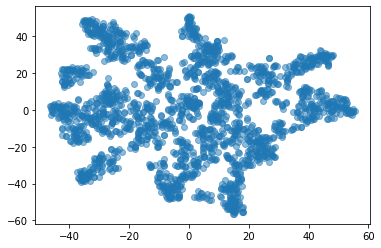

In [252]:
plt.scatter(xs, ys,
            alpha=0.5);


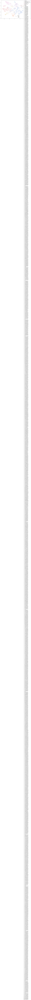

In [257]:
plt.figure(figsize=(16,10))
sns.scatterplot(
    x=xs, y=ys,
    hue='prime_topic',
    palette=sns.color_palette("muted", 10),
    data=doc_topic_nmf_rich,
    legend="full",
    #markers='polarity_plutchik',
    size='dislike_perc_of_likes',
    alpha=0.8
    #joint_kws={"color":colors, "marker":markers}
);

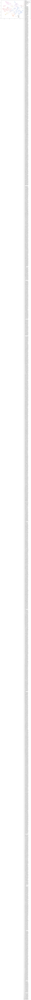

In [254]:
plt.figure(figsize=(16,10))
sns.scatterplot(
    x=xs, y=ys,
    hue='prime_topic',
    palette=sns.color_palette("muted", 10),
    data=doc_topic_nmf_rich,
    legend='full',
    markers='polarity_plutchik',
    size='dislike_perc_of_likes',
    alpha=0.8
    #joint_kws={"color":colors, "marker":markers}
);

In [ ]:
size = 100 * (iris.petal_length / iris.petal_length.max())
g = sns.PairGrid(iris, vars=["sepal_length", "sepal_width"], size=5)
g.map(plt.scatter, s=size)

In [ ]:
#Simgle Topic Profile

In [261]:
doc_topic_nmf_rich_gender.columns

Index(['video_id', 'Progress with technology', 'Phylosophy of life',
       'Healthcare and desease treatment', 'International Politics',
       'Planet sustainability', 'Gender', 'Urbanistics',
       'Younger generation education', 'Neuroscience', 'Automation',
       'prime_topic', 'transcript', 'polarity_neg_transcript',
       'polarity_pos_transcript', 'polarity_neu_transcript',
       'polarity_compound_transcript', 'tags', 'title', 'publushed_date',
       'comments_count', 'dislike_count', 'like_count', 'views_count', 'today',
       'days_age', 'views_per_day', 'dislike_perc_of_likes', 'success',
       'prime_tag', 'comments', 'polarity_neg_comments',
       'polarity_pos_comments', 'polarity_neu_comments',
       'polarity_compound_comments', 'trust', 'fear', 'negative', 'sadness',
       'anger', 'surprise', 'positive', 'disgust', 'joy', 'anticipation',
       'prime_emotion', 'polarity_vader', 'polarity_plutchik'],
      dtype='object')

In [260]:
doc_topic_nmf_rich_gender = doc_topic_nmf_rich[doc_topic_nmf_rich['prime_topic'] == 'Gender']

In [266]:
doc_topic_nmf_rich_gender

,video_id,Progress with technology,Phylosophy of life,Healthcare and desease treatment,International Politics,Planet sustainability,Gender,Urbanistics,Younger generation education,Neuroscience,...,sadness,anger,surprise,positive,disgust,joy,anticipation,prime_emotion,polarity_vader,polarity_plutchik
9,bW941OpsnMM,0.00000,0.05586,0.00436,0.05548,0.02542,0.09608,0.02194,0.01864,0.00000,...,0.001824,0.000912,0.003192,0.018240,0.000000,0.013680,0.008208,joy,polarity_pos_comments,positive
15,z3d_UsYgt1c,0.00194,0.00000,0.00798,0.02102,0.08306,0.09855,0.02744,0.01313,0.00000,...,0.001824,0.001824,0.001368,0.015504,0.000456,0.007752,0.003192,trust,polarity_pos_comments,positive
36,KGPjwFw6JaQ,0.00000,0.00000,0.05896,0.02577,0.00000,0.15070,0.01593,0.07542,0.00000,...,0.001368,0.001368,0.004560,0.013224,0.001368,0.008664,0.005928,trust,polarity_pos_comments,positive
45,I6xuJu7gLe0,0.00050,0.04412,0.00000,0.00688,0.00501,0.09878,0.01263,0.00977,0.00899,...,0.001824,0.001368,0.000912,0.006384,0.000912,0.002736,0.002280,trust,polarity_pos_comments,positive
57,IfOqyuxb5S0,0.03031,0.00000,0.00129,0.04758,0.00000,0.20029,0.00000,0.00000,0.00000,...,0.003192,0.003648,0.001824,0.012312,0.002280,0.004560,0.003648,trust,polarity_pos_comments,positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1859,V1yW5IsnSjo,0.00000,0.08108,0.00000,0.00899,0.00000,0.08397,0.01388,0.02210,0.00000,...,0.003648,0.004560,0.001824,0.005928,0.001368,0.002280,0.002280,trust,polarity_pos_comments,positive
1862,ueOqYebVhtc,0.02005,0.04946,0.00000,0.00000,0.00000,0.10171,0.00000,0.03269,0.00000,...,0.001368,0.001824,0.004560,0.013224,0.001824,0.008664,0.004560,trust,polarity_pos_comments,positive
1974,RG5QP2EVUVY,0.00000,0.00056,0.00000,0.10647,0.00000,0.15778,0.00000,0.00000,0.00000,...,0.002280,0.000912,0.003648,0.008208,0.001368,0.004560,0.005928,trust,polarity_pos_comments,positive
2003,2BOTS9GAjc4,0.00000,0.01716,0.02230,0.05320,0.01236,0.15370,0.00107,0.10216,0.00000,...,0.004560,0.005472,0.002280,0.011400,0.001824,0.004104,0.006384,trust,polarity_neg_comments,positive


In [269]:
tsne_features_gender = tsne.fit_transform(doc_topic_nmf_rich_gender.loc[:, ['trust', 'fear', 'sadness', 'anger', 
                                                                'surprise', 'disgust', 'joy', 
                                                                'anticipation']])

In [270]:
xs = tsne_features_gender[:, 0]
ys = tsne_features_gender[:, 1]

In [271]:
len(xs)

114

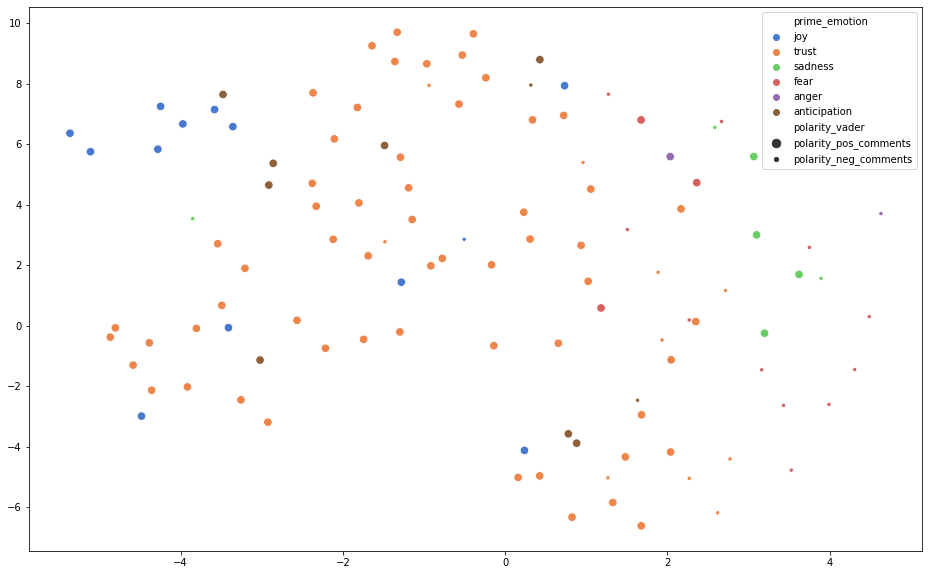

In [279]:
plt.figure(figsize=(16,10))
sns.scatterplot(
    x=xs, y=ys,
    hue='prime_emotion',
    palette=sns.color_palette("muted", 6),
    data=doc_topic_nmf_rich_gender,
    legend='full',
    #markers='polarity_plutchik',
    size='polarity_vader',
    alpha=1
    #joint_kws={"color":colors, "marker":markers}
);

In [285]:
doc_topic_nmf_rich_life = doc_topic_nmf_rich[doc_topic_nmf_rich['prime_topic'] == 'Phylosophy of life']

In [286]:
tsne_features_life = tsne.fit_transform(doc_topic_nmf_rich_life.loc[:, ['trust', 'fear', 'sadness', 'anger', 
                                                                'surprise', 'disgust', 'joy', 
                                                                'anticipation']])

In [294]:
xs = tsne_features_life[:, 0]
ys = tsne_features_life[:, 1]

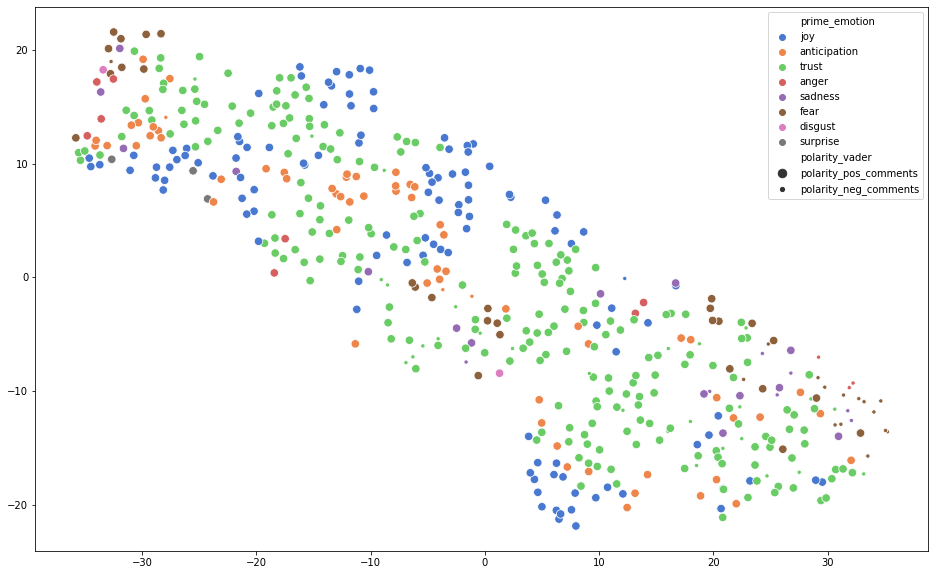

In [295]:
plt.figure(figsize=(16,10))
sns.scatterplot(
    x=xs, y=ys,
    hue='prime_emotion',
    palette=sns.color_palette("muted", 8),
    data=doc_topic_nmf_rich_life,
    legend='full',
    #markers='polarity_plutchik',
    size='polarity_vader',
    alpha=1
    #joint_kws={"color":colors, "marker":markers}
);

In [296]:
doc_topic_nmf_rich_Automation = doc_topic_nmf_rich[doc_topic_nmf_rich['prime_topic'] == 'Automation']

In [298]:
tsne_features_Automation = tsne.fit_transform(doc_topic_nmf_rich_Automation.loc[:, ['trust', 'fear', 'sadness', 'anger', 
                                                                'surprise', 'disgust', 'joy', 
                                                                'anticipation']])

In [299]:
xs = tsne_features_Automation[:, 0]
ys = tsne_features_Automation[:, 1]

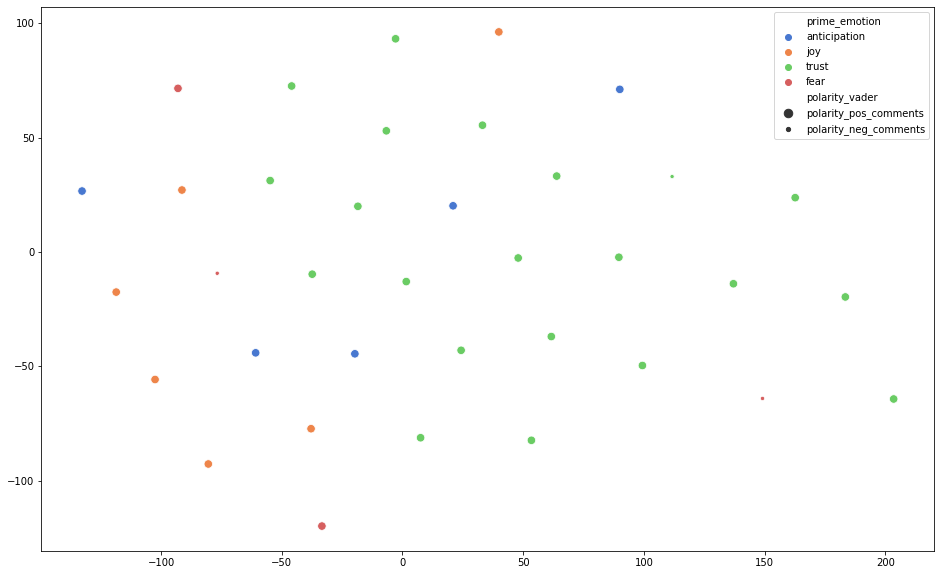

In [304]:
plt.figure(figsize=(16,10))
sns.scatterplot(
    x=xs, y=ys,
    hue='prime_emotion',
    palette=sns.color_palette("muted", 4),
    data=doc_topic_nmf_rich_Automation,
    legend='full',
    #markers='polarity_plutchik',
    size='polarity_vader',
    alpha=1
    #joint_kws={"color":colors, "marker":markers}
);

In [ ]:
sns.barplot()

In [282]:
len(doc_topic)

2416

In [152]:
pairwise_distances(doc_topic[0].reshape(1, -1),doc_topic,metric='cosine').argsort()

array([[   0,  293,  828, ..., 1685,  229, 1662]])